In [2]:
# Carga de librerías
import numpy as np
import tensorflow as tf
import PIL
import PIL.Image
import pathlib
import scipy as sp
import seaborn as sns
from itertools import product
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
import os


In [3]:
import pickle
import sys
from pathlib import Path

# Añadir el directorio raíz del proyecto a sys.path
module_path = Path('/Users/Cesar/Desktop/Proyecto-CSG/').resolve()
if module_path not in sys.path:
    sys.path.append(str(module_path))

# Añadir el directorio que contiene 'new_spectral_metric' a sys.path
new_spectral_metric_path = module_path / '/Users/Cesar/Desktop/Proyecto-CSG/new_spectral_metric/'
if new_spectral_metric_path not in sys.path:
    sys.path.append(str(new_spectral_metric_path))

from numpy.linalg import LinAlgError
from scipy.sparse.csgraph import laplacian
# from spectral_metric.lib import find_samples, compute_expectation_with_monter_carlo 
from new_spectral_metric.new_estimator import CumulativeGradientEstimator
from new_spectral_metric.new_visualize import make_graph
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Conv2D, Dense, MaxPooling2D, Lambda
from tensorflow.keras import backend as K
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib.collections import LineCollection
from matplotlib.font_manager import FontProperties
from pathlib import Path


In [4]:
# Lectura de dataset

directorio_dataset = ('../Datasets/Cats and dogs - train')
directorio_dataset = pathlib.Path(directorio_dataset)

imagenes_cats = ('../Datasets/Cats and dogs - train/cats')
imagenes_cats = pathlib.Path(imagenes_cats)

imagenes_dogs = ('../Datasets/Cats and dogs - train/dogs')
imagenes_dogs = pathlib.Path(imagenes_dogs)

total_dataset = len(list(directorio_dataset.glob('*/*.jpg')))  # Cuenta la cantidad de imagenes del dataset (Aqui busca en las subcarpetas del directorio del dataset)
total_cats = len(list(imagenes_cats.glob('*.jpg')))  # Cuenta la cantidad de imagenes de la clase original (Aqui busca directamente en la carpeta cat)
total_dogs = len(list(imagenes_dogs.glob('*.jpg')))  # Cuenta la cantidad de imagenes de la clase corrupta (Aqui busca directamente en la carpeta cat_c_defocus_blur)

print(f"Total imagenes dataset: {total_dataset}")
print(f"Total imagenes cats: {total_cats}")
print(f"Total imagenes dogs: {total_dogs}")

Total imagenes dataset: 696
Total imagenes cats: 348
Total imagenes dogs: 348


In [5]:
# Dimensiones de imagen y tamaño de batch
img_height = 256
img_width = 256
#batch_size = len(list(data_dir.glob('*/*.png'))) # leer todas las imágenes al tiempo
batch_size = total_dataset

In [6]:

# Data splitting (entrenamiento y validación)
all_images_in_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  directorio_dataset,
  #validation_split=0.2,
  color_mode='rgb',
  label_mode='int',
  #subset="training",
  #seed=123,
  shuffle=False,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 696 files belonging to 2 classes.


In [7]:
class_names = all_images_in_dataset.class_names
num_classes = len(class_names)  # get the number of the classes
print(f"Número de clases: {num_classes}")
print(f"Los nombres de las clases son: {class_names}")



Número de clases: 2
Los nombres de las clases son: ['cats', 'dogs']


In [8]:
# Revisar etiquetas de las imágenes
for images, labels in all_images_in_dataset:
    labels = labels.numpy() if hasattr(labels, 'numpy') else labels
    for label in labels:
        assert label in [0, 1], f"Etiqueta inesperada {label} en la imagen."


In [9]:
for images, labels0 in all_images_in_dataset.take(1):  # only take first element of dataset
    numpy_all_images = images.numpy()  # convertir el tensor de imágenes en un arreglo de numpy y ahora contiene las imágenes del conjunto de datos en formato de numpy.
    numpy_all_labels = labels0.numpy()  # convierte el tensor de etiquetas en un arreglo de numpy y ahora contiene las etiquetas del conjunto de datos en formato de numpy

numpy_all_images /= 255.0  # Scale the features to the [0, 1] range
print(numpy_all_images.shape)

(696, 256, 256, 3)


In [10]:
# Aplanar las imágenes
fully_dataset = numpy_all_images.reshape((numpy_all_images.shape[0], numpy_all_images.shape[1]*numpy_all_images.shape[2]*numpy_all_images.shape[3])) # es un arreglo bidimensional donde cada fila representa una imagen y cada columna representa un píxel de la imagen
fully_labels = numpy_all_labels.reshape(numpy_all_labels.shape[0],)


# Inicializar el estimador
estimator = CumulativeGradientEstimator(M_sample=348, k_nearest=10)
estimator.fit(data=fully_dataset, target=fully_labels)
csg = estimator.csg  # The actual complexity values.
estimator.evals, estimator.evecs  # The eigenvalues and vectors.

make_graph(estimator.difference, title="Comparative between two clases, CSG: "+str(csg), classes=class_names)

c:\Users\Cesar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:53: RuntimeWarning: overflow encountered in reduce
  return umr_prod(a, axis, dtype, out, keepdims, initial, where)
c:\Users\Cesar\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\core\_methods.py:53: RuntimeWarning: overflow encountered in reduce
  return umr_prod(a, axis, dtype, out, keepdims, initial, where)


KeyboardInterrupt: 

In [13]:
# Ordena los pares de clases en orden de similitud ascendente (menos similar primero)
pairs = list(zip(*np.unravel_index(np.argsort(estimator.W, axis=None), estimator.W.shape)))
pairs = [(original,corrupto) for original,corrupto in pairs if original != corrupto]

similitud_de_clases = pairs[0]
original, corrupto = similitud_de_clases  # Pares de clases menos similares

print("Calculo de similitud entre clases")
lst = []
for idx, (original,corrupto) in enumerate(pairs[::2][:1]):
    lst.append({"Clases a comparar" : f"{class_names[original]} <> {class_names[corrupto]}", "Similitud": estimator.W[original,corrupto]})
print(pd.DataFrame(lst))
print(estimator.W.shape)

Calculo de similitud entre clases
  Clases a comparar  Similitud
0      cats <> dogs   0.942377
(2, 2)


In [14]:
for class_name, indices in estimator.class_indices.items():
    print(f"Clase: {class_names}, Número de muestras: {len(indices)}")


Clase: ['cats', 'dogs'], Número de muestras: 348
Clase: ['cats', 'dogs'], Número de muestras: 348


In [15]:

# Obtener todos los nombres de archivo en el dataset
filenames = [str(f) for f in directorio_dataset.glob('*/*.jpg')]

# Crear un mapeo de índices a nombres de archivo (solo el nombre de archivo, sin la ruta)
filenames_dict = {i: f.name for i, f in enumerate(directorio_dataset.glob('*/*.jpg'))}

def show_least_similar_using_P(source_intent, target_intent, estimator, class_names, filenames_dict):
    print(f"{class_names[source_intent]} <> {class_names[target_intent]}")
    
    # Obtener la matriz de similitud de las muestras entre las clases
    P = estimator.P[(source_intent, target_intent)]
    
    # Ordenar los índices según las similitudes (de menor a mayor)
    least_similar_indices = np.argsort(P, axis=None)
    
    # Conjunto para llevar un registro de los archivos ya mostrados
    shown_files = set()
    count = 0
    
    for idx in least_similar_indices:
        if count >= 10:
            break
        
        # Convertir el índice plano a índice 2D
        idx_2d = np.unravel_index(idx, P.shape)
        
        # Obtener los índices de las muestras en el dataset
        source_idx = estimator.class_indices[source_intent][idx_2d[0]]
        target_idx = estimator.class_indices[target_intent][idx_2d[1]]
        
        # Verificar que los índices estén dentro de los límites del dataset
        if source_idx < len(filenames_dict) and target_idx < len(filenames_dict):
            source_filename = filenames_dict[int(source_idx)]
            target_filename = filenames_dict[int(target_idx)]
            
            if source_filename not in shown_files and target_filename not in shown_files:
                shown_files.add(source_filename)
                shown_files.add(target_filename)
                
                value = P[idx_2d]
                print(f"\tNombre del archivo: {source_filename}, Clase: {class_names[source_intent]}, Similitud: {value:.4f}")
                count += 1

# Suponiendo que `pairs` contiene los índices de las clases en el formato [(0, 1)]
pairs = [(0, 1)]

first_pair = pairs[0]

# Mostrar los menos similares usando la matriz de pares (P)
show_least_similar_using_P(first_pair[0], first_pair[1], estimator, class_names, filenames_dict)
show_least_similar_using_P(first_pair[1], first_pair[0], estimator, class_names, filenames_dict)
for class_name, indices in estimator.class_indices.items():
    print(f"Clase: {class_name}, Número de muestras: {len(indices)}")


cats <> dogs
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0674
	Nombre del archivo: cat_96.jpg, Clase: cats, Similitud: 0.1821
	Nombre del archivo: cat_435.jpg, Clase: cats, Similitud: 0.1844
	Nombre del archivo: cat_369.jpg, Clase: cats, Similitud: 0.1865
	Nombre del archivo: cat_50.jpg, Clase: cats, Similitud: 0.1887
	Nombre del archivo: cat_109.jpg, Clase: cats, Similitud: 0.2088
	Nombre del archivo: cat_546.jpg, Clase: cats, Similitud: 0.2406
	Nombre del archivo: cat_101.jpg, Clase: cats, Similitud: 0.2505
	Nombre del archivo: cat_303.jpg, Clase: cats, Similitud: 0.2658
	Nombre del archivo: cat_420.jpg, Clase: cats, Similitud: 0.3095
dogs <> cats
	Nombre del archivo: dog_403.jpg, Clase: dogs, Similitud: 0.0674
	Nombre del archivo: dog_505.jpg, Clase: dogs, Similitud: 0.1821
	Nombre del archivo: dog_197.jpg, Clase: dogs, Similitud: 0.1844
	Nombre del archivo: dog_412.jpg, Clase: dogs, Similitud: 0.1865
	Nombre del archivo: dog_344.jpg, Clase: dogs, Similitud: 0.1887
	

Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):
1. Similitud: 0.8422, Índice de la muestra de 'dogs': 567, Nombre del archivo: dog_433.jpg
2. Similitud: 0.3925, Índice de la muestra de 'dogs': 640, Nombre del archivo: dog_543.jpg
3. Similitud: 0.8719, Índice de la muestra de 'dogs': 516, Nombre del archivo: dog_35.jpg
4. Similitud: 0.7798, Índice de la muestra de 'dogs': 543, Nombre del archivo: dog_393.jpg
5. Similitud: 0.8368, Índice de la muestra de 'dogs': 615, Nombre del archivo: dog_504.jpg
6. Similitud: 0.6871, Índice de la muestra de 'dogs': 539, Nombre del archivo: dog_389.jpg
7. Similitud: 0.7116, Índice de la muestra de 'dogs': 463, Nombre del archivo: dog_272.jpg
8. Similitud: 0.6695, Índice de la muestra de 'dogs': 605, Nombre del archivo: dog_485.jpg
9. Similitud: 0.5543, Índice de la muestra de 'dogs': 350, Nombre del archivo: dog_100.jpg
10. Similitud: 0.7993, Índice de la muestra de 'dogs': 579, Nombre del archivo: dog_446.jpg

Similitud: 

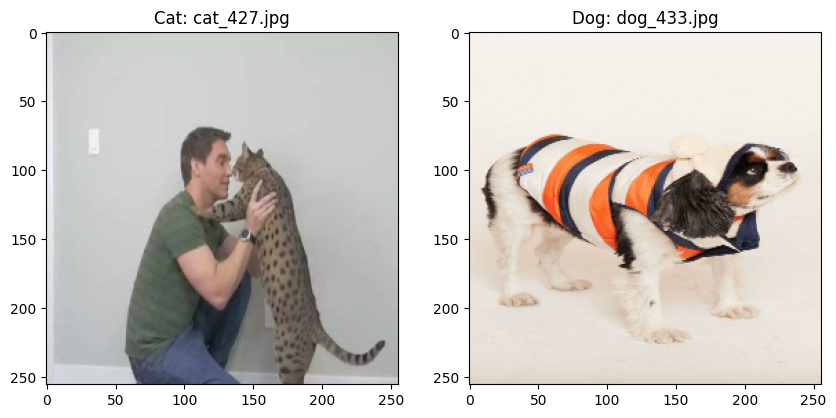


Similitud: 0.3925
Nombre del archivo: dog_543.jpg


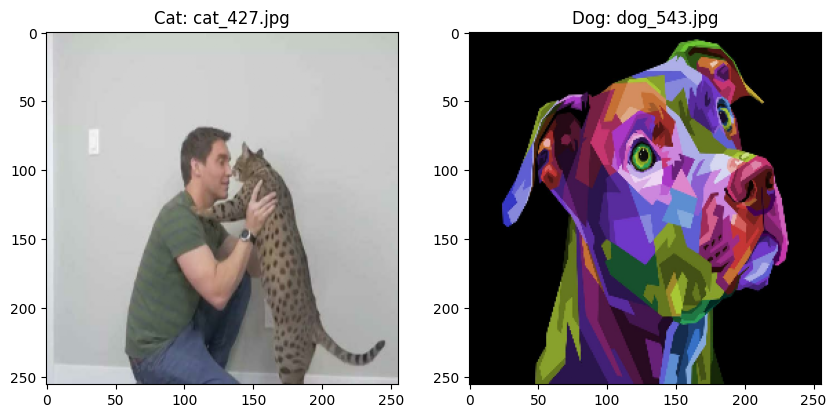


Similitud: 0.8719
Nombre del archivo: dog_35.jpg


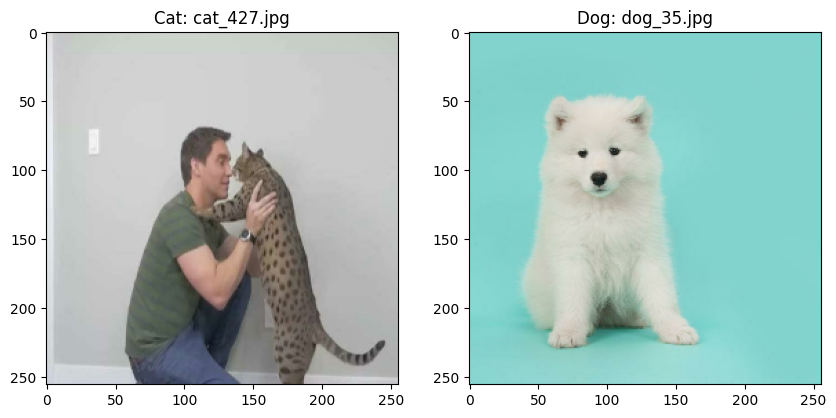


Similitud: 0.7798
Nombre del archivo: dog_393.jpg


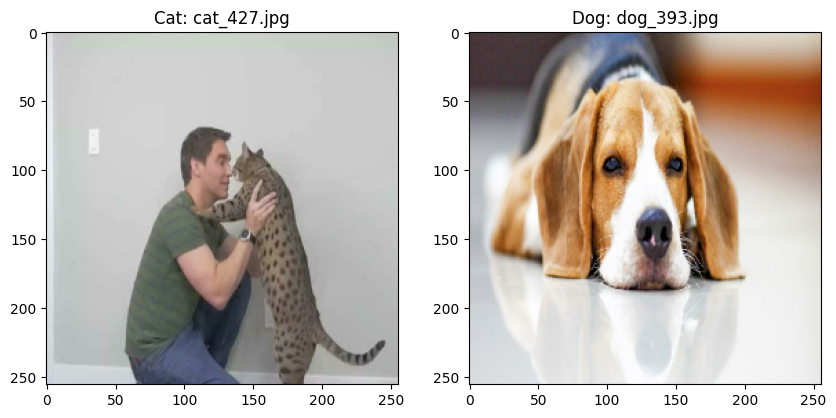


Similitud: 0.8368
Nombre del archivo: dog_504.jpg


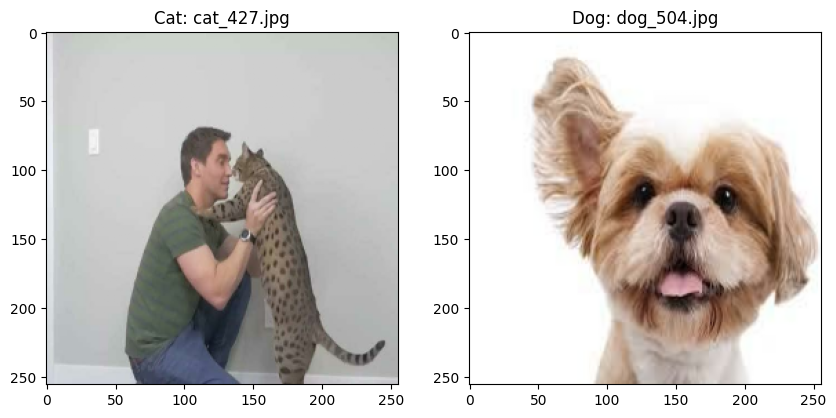


Similitud: 0.6871
Nombre del archivo: dog_389.jpg


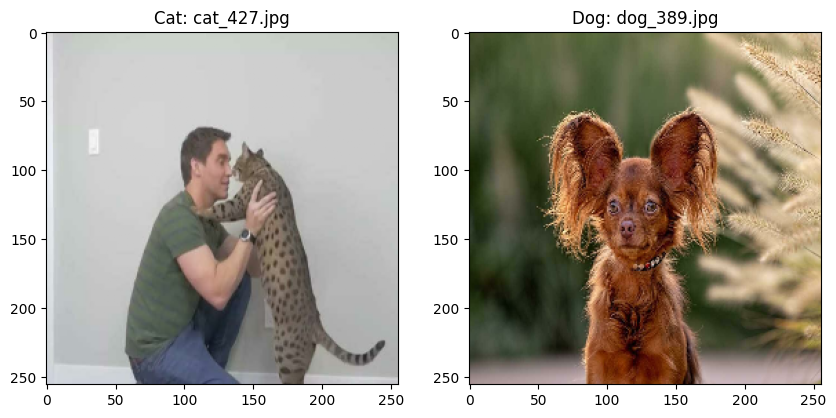


Similitud: 0.7116
Nombre del archivo: dog_272.jpg


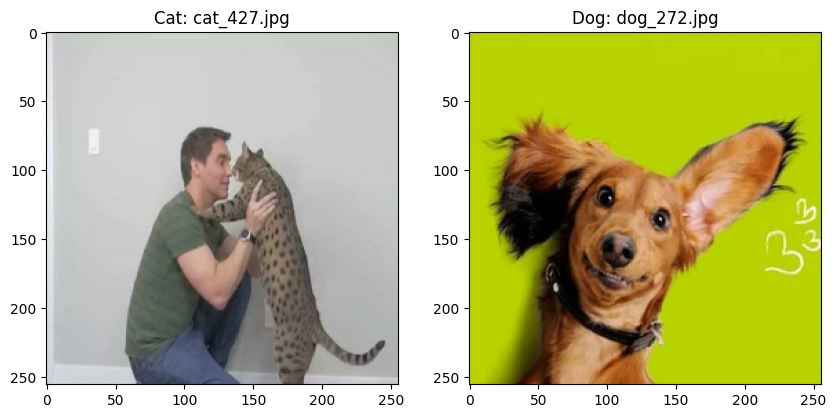


Similitud: 0.6695
Nombre del archivo: dog_485.jpg


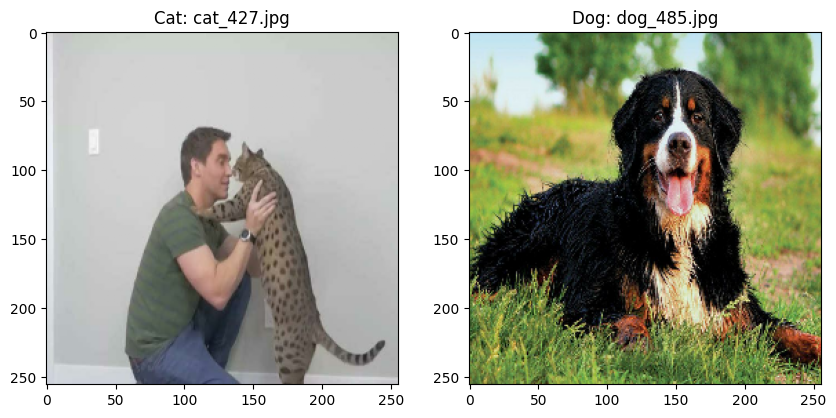


Similitud: 0.5543
Nombre del archivo: dog_100.jpg


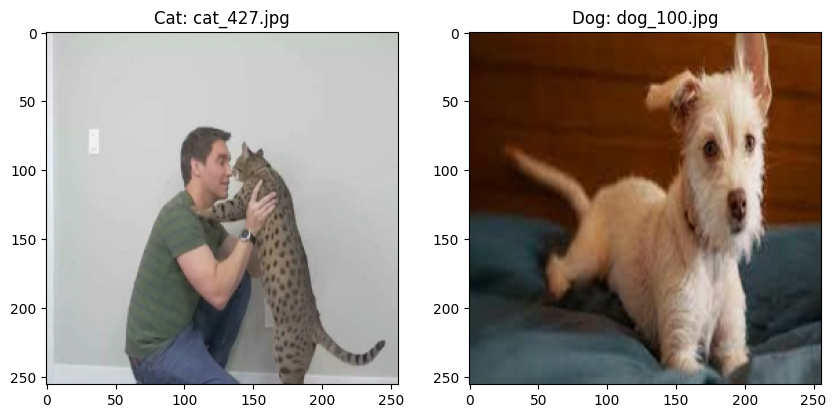


Similitud: 0.7993
Nombre del archivo: dog_446.jpg


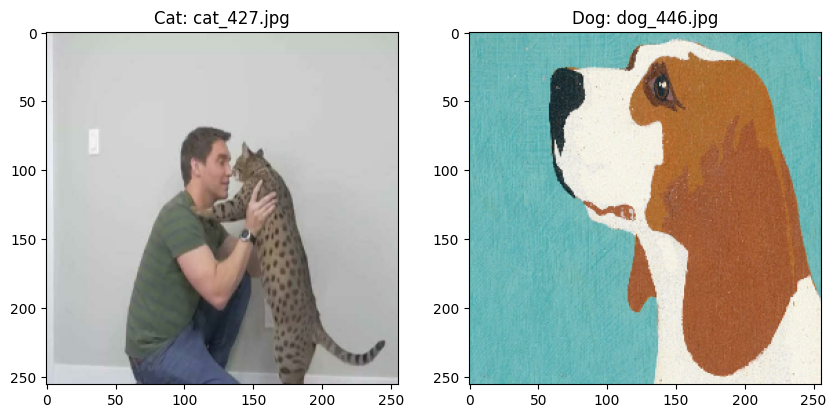

In [18]:
import numpy as np
import scipy.spatial

# Definir las clases (esto se asume basado en tu contexto)
class_cats = 0
class_dogs = 1

# Obtener los índices de las muestras de las clases 'cats' y 'dogs'
cats_indices = estimator.class_indices[class_cats]
dogs_indices = estimator.class_indices[class_dogs]

# Seleccionar la primera muestra de la clase 'cats'
sample_cat = fully_dataset[cats_indices[0]]

# Crear un array para almacenar las similitudes con las muestras de 'dogs'
similarities = []

# Calcular la similitud (disimilitud) entre la muestra de 'cats' y todas las muestras de 'dogs'
for dog_index in dogs_indices:
    sample_dog = fully_dataset[dog_index]
    similarity = 1 - scipy.spatial.distance.braycurtis(sample_cat, sample_dog)
    similarities.append((similarity, dog_index))

# Ordenar las similitudes en orden ascendente (menos similar primero)
# similarities.sort()


# Mostrar las 10 muestras menos similares
print("Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):")
for i, (similarity, dog_index) in enumerate(similarities[-10:]):
    print(f"{i+1}. Similitud: {similarity:.4f}, Índice de la muestra de 'dogs': {dog_index}, Nombre del archivo: {filenames_dict[dog_index].name}")

# Mostrar las imágenes de las 10 muestras menos similares
for similarity, dog_index in similarities[-10:]:
    sample_dog_filename = filenames_dict[dog_index]
    print(f"\nSimilitud: {similarity:.4f}")
    print(f"Nombre del archivo: {sample_dog_filename.name}")
    
    img_cat = fully_dataset[cats_indices[0]].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    img_dog = fully_dataset[dog_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    
    # Mostrar las imágenes usando matplotlib
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img_cat)
    axs[0].set_title(f"Cat: {filenames_dict[cats_indices[0]].name}")
    axs[1].imshow(img_dog)
    axs[1].set_title(f"Dog: {sample_dog_filename.name}")
    plt.show()


Primera muestra de 'cats': Índice 213, Nombre del archivo: cat_427.jpg
Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):
1. Similitud: 0.8711, Índice de la muestra de 'dogs': 621, Nombre del archivo: dog_514.jpg
2. Similitud: 0.8717, Índice de la muestra de 'dogs': 597, Nombre del archivo: dog_475.jpg
3. Similitud: 0.8719, Índice de la muestra de 'dogs': 516, Nombre del archivo: dog_35.jpg
4. Similitud: 0.8724, Índice de la muestra de 'dogs': 679, Nombre del archivo: dog_76.jpg
5. Similitud: 0.8729, Índice de la muestra de 'dogs': 680, Nombre del archivo: dog_77.jpg
6. Similitud: 0.8764, Índice de la muestra de 'dogs': 595, Nombre del archivo: dog_473.jpg
7. Similitud: 0.8776, Índice de la muestra de 'dogs': 558, Nombre del archivo: dog_418.jpg
8. Similitud: 0.8803, Índice de la muestra de 'dogs': 438, Nombre del archivo: dog_234.jpg
9. Similitud: 0.8891, Índice de la muestra de 'dogs': 538, Nombre del archivo: dog_381.jpg
10. Similitud: 0.8906, Índice de la

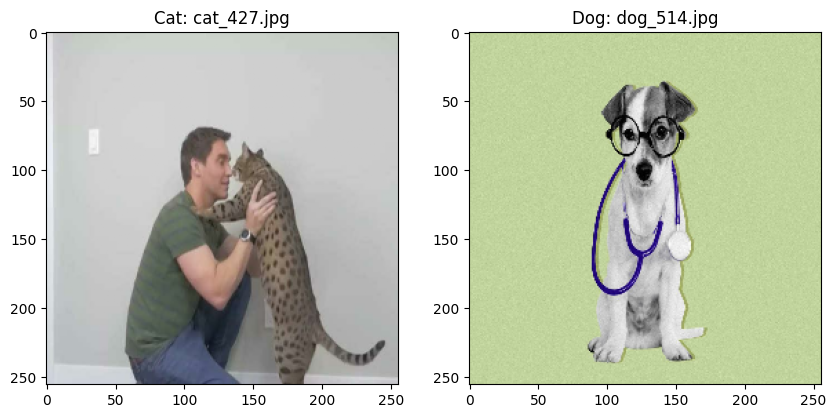


Similitud: 0.8717
Nombre del archivo: dog_475.jpg


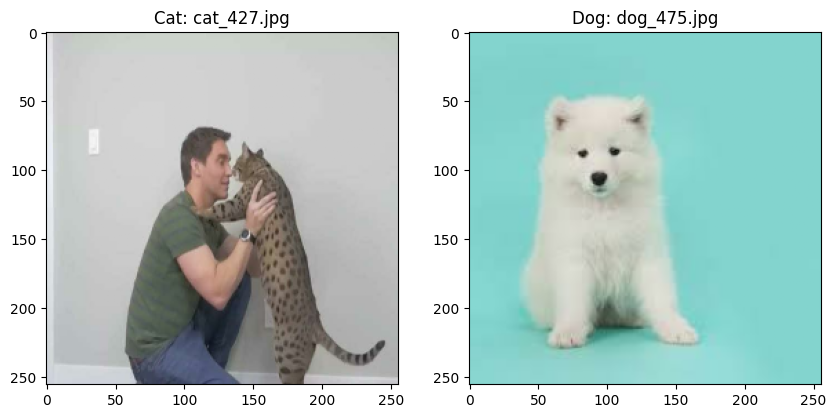


Similitud: 0.8719
Nombre del archivo: dog_35.jpg


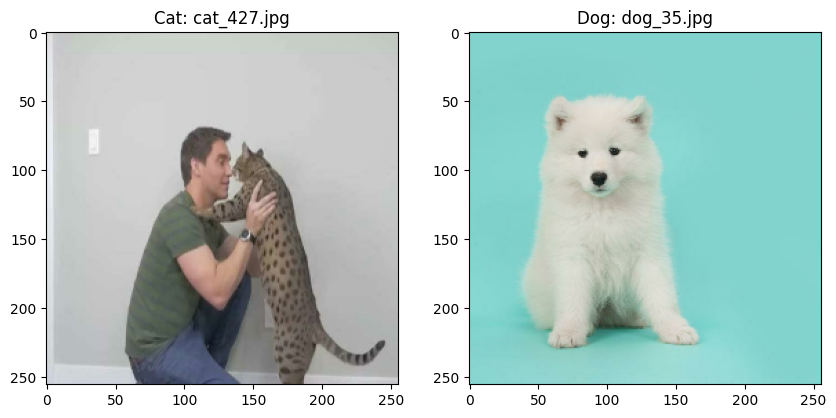


Similitud: 0.8724
Nombre del archivo: dog_76.jpg


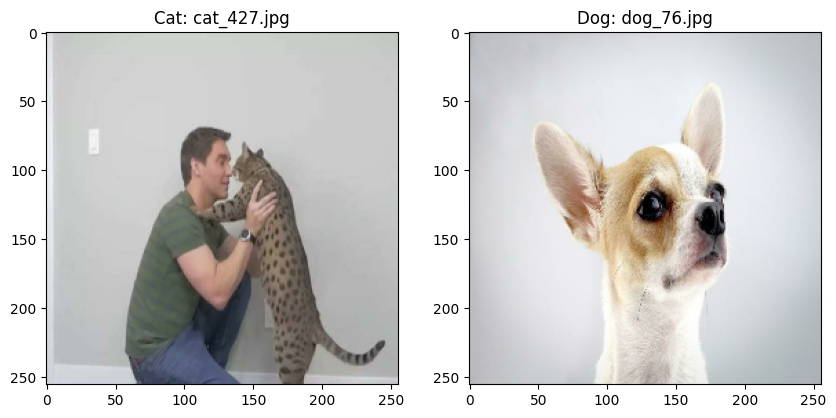


Similitud: 0.8729
Nombre del archivo: dog_77.jpg


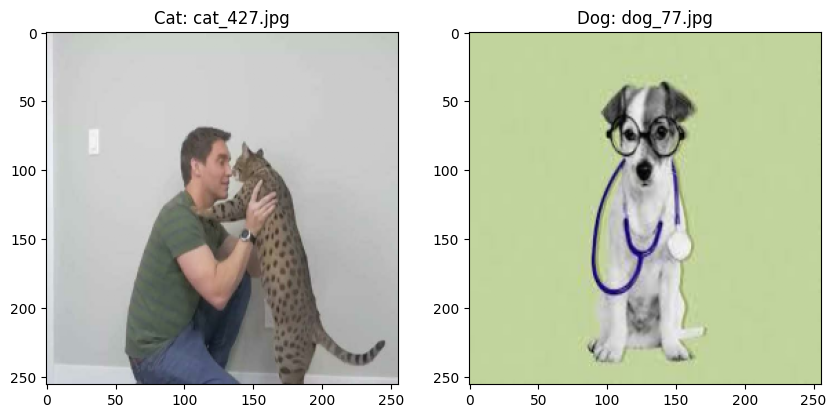


Similitud: 0.8764
Nombre del archivo: dog_473.jpg


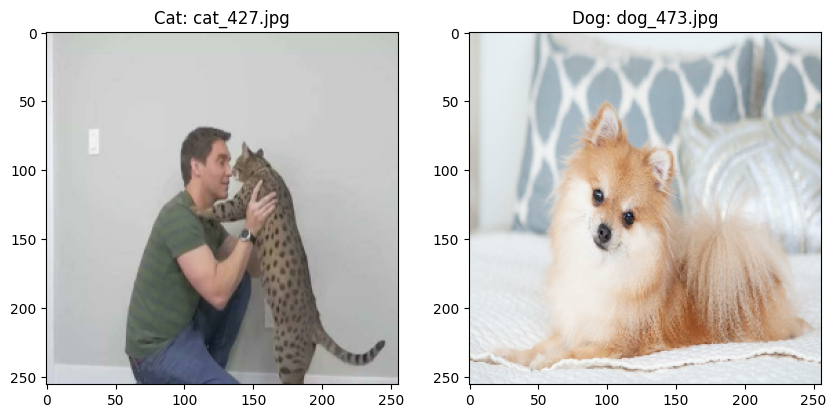


Similitud: 0.8776
Nombre del archivo: dog_418.jpg


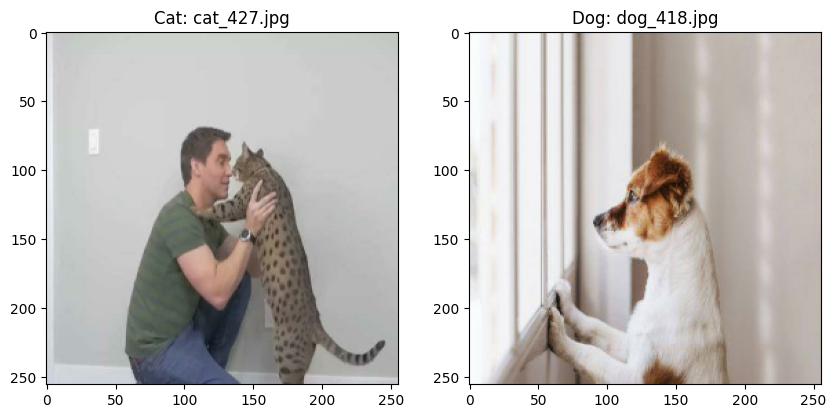


Similitud: 0.8803
Nombre del archivo: dog_234.jpg


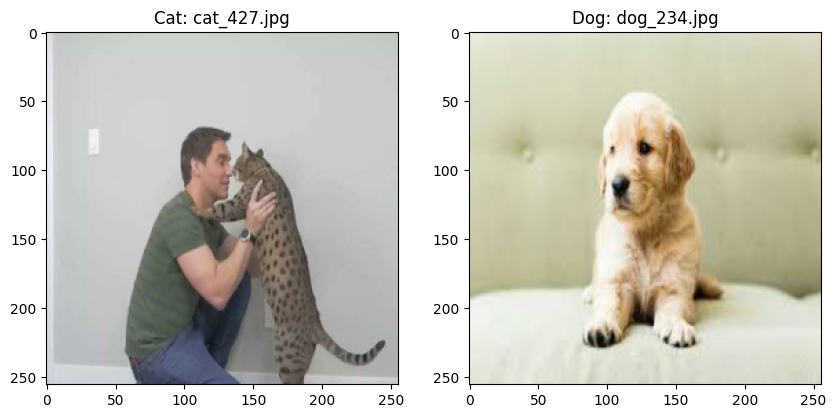


Similitud: 0.8891
Nombre del archivo: dog_381.jpg


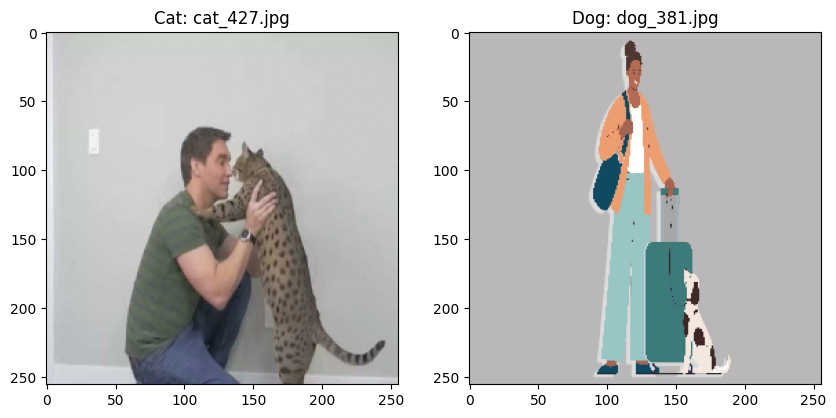


Similitud: 0.8906
Nombre del archivo: dog_333.jpg


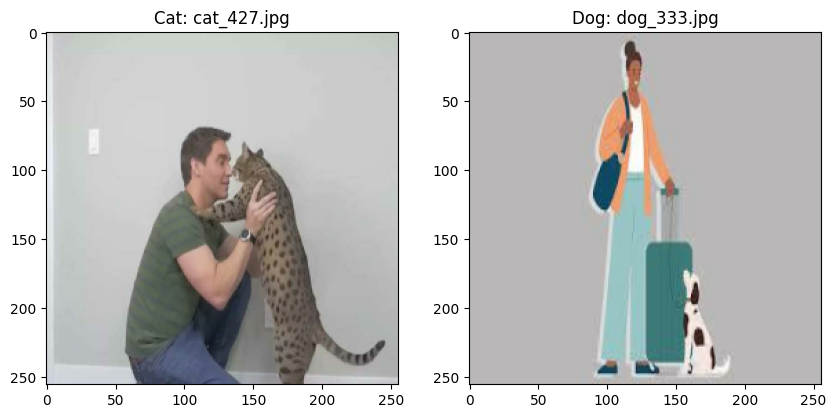

In [19]:
import numpy as np
import scipy.spatial
import matplotlib.pyplot as plt

# Definir las clases (esto se asume basado en tu contexto)
class_cats = 0
class_dogs = 1

# Obtener los índices de las muestras de las clases 'cats' y 'dogs'
cats_indices = estimator.class_indices[class_cats]
dogs_indices = estimator.class_indices[class_dogs]

# Asegurarnos de seleccionar la primera muestra de la clase 'cats' correctamente
first_cat_index = cats_indices[0]
sample_cat = fully_dataset[first_cat_index]

# Verificar que la primera muestra de la clase 'cats' sea la esperada
print(f"Primera muestra de 'cats': Índice {first_cat_index}, Nombre del archivo: {filenames_dict[first_cat_index].name}")

# Crear un array para almacenar las similitudes con las muestras de 'dogs'
similarities = []

# Calcular la similitud (disimilitud) entre la muestra de 'cats' y todas las muestras de 'dogs'
for dog_index in dogs_indices:
    sample_dog = fully_dataset[dog_index]
    similarity = 1 - scipy.spatial.distance.braycurtis(sample_cat, sample_dog)
    similarities.append((similarity, dog_index))

# Ordenar las similitudes en orden ascendente (menos similar primero)
similarities.sort()

# Mostrar las 10 muestras menos similares
print("Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):")
for i, (similarity, dog_index) in enumerate(similarities[-10:]):
    print(f"{i+1}. Similitud: {similarity:.4f}, Índice de la muestra de 'dogs': {dog_index}, Nombre del archivo: {filenames_dict[dog_index].name}")

# Mostrar las imágenes de las 10 muestras menos similares
for similarity, dog_index in similarities[-10:]:
    sample_dog_filename = filenames_dict[dog_index]
    print(f"\nSimilitud: {similarity:.4f}")
    print(f"Nombre del archivo: {sample_dog_filename.name}")
    
    img_cat = fully_dataset[first_cat_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    img_dog = fully_dataset[dog_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    
    # Mostrar las imágenes usando matplotlib
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img_cat)
    axs[0].set_title(f"Cat: {filenames_dict[first_cat_index].name}")
    axs[1].imshow(img_dog)
    axs[1].set_title(f"Dog: {sample_dog_filename.name}")
    plt.show()


Primera muestra de 'cats': Índice 0, Nombre del archivo: cat_1.jpg
Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):
1. Similitud: 0.8068, Índice de la muestra de 'dogs': 573, Nombre del archivo: dog_440.jpg
2. Similitud: 0.8088, Índice de la muestra de 'dogs': 406, Nombre del archivo: dog_196.jpg
3. Similitud: 0.8102, Índice de la muestra de 'dogs': 549, Nombre del archivo: dog_404.jpg
4. Similitud: 0.8113, Índice de la muestra de 'dogs': 484, Nombre del archivo: dog_302.jpg
5. Similitud: 0.8151, Índice de la muestra de 'dogs': 453, Nombre del archivo: dog_259.jpg
6. Similitud: 0.8218, Índice de la muestra de 'dogs': 459, Nombre del archivo: dog_267.jpg
7. Similitud: 0.8225, Índice de la muestra de 'dogs': 495, Nombre del archivo: dog_321.jpg
8. Similitud: 0.8257, Índice de la muestra de 'dogs': 569, Nombre del archivo: dog_436.jpg
9. Similitud: 0.8317, Índice de la muestra de 'dogs': 420, Nombre del archivo: dog_212.jpg
10. Similitud: 0.8350, Índice de la 

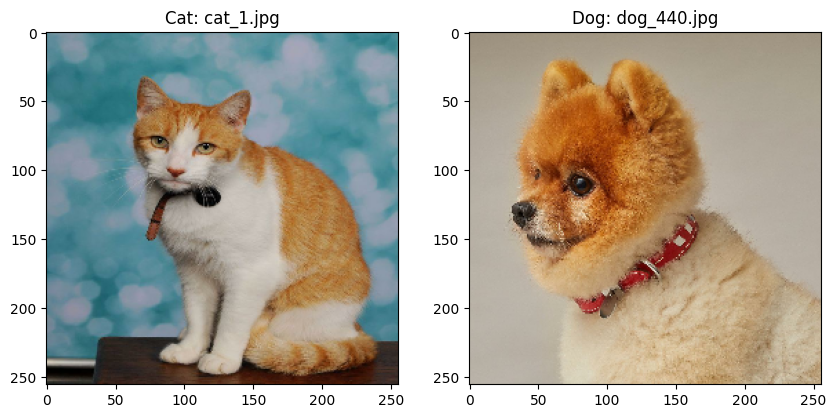


Similitud: 0.8088
Nombre del archivo: dog_196.jpg


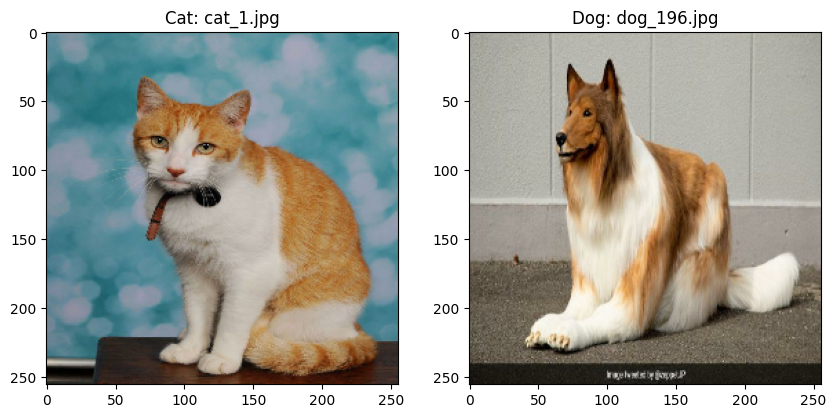


Similitud: 0.8102
Nombre del archivo: dog_404.jpg


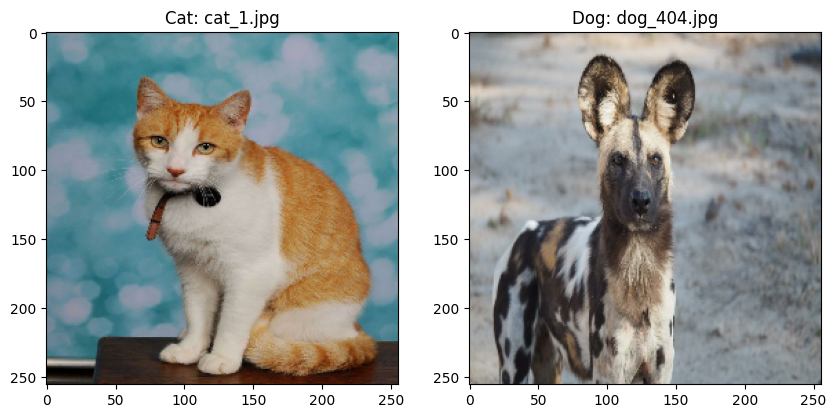


Similitud: 0.8113
Nombre del archivo: dog_302.jpg


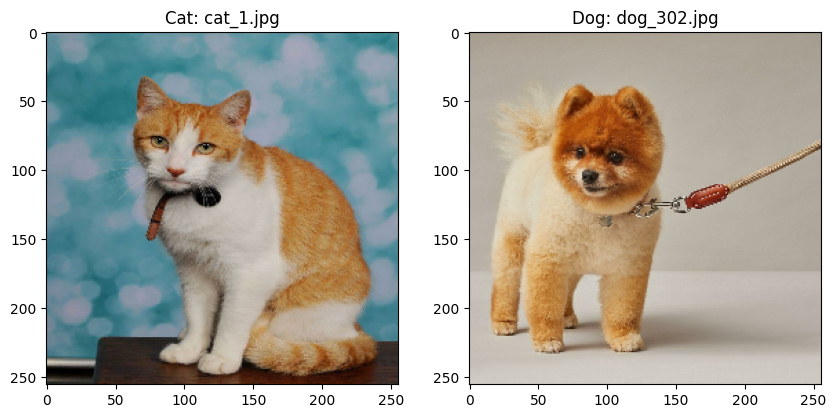


Similitud: 0.8151
Nombre del archivo: dog_259.jpg


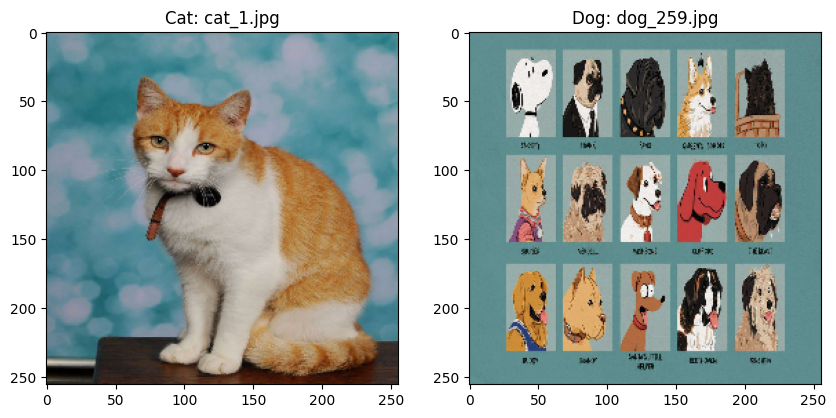


Similitud: 0.8218
Nombre del archivo: dog_267.jpg


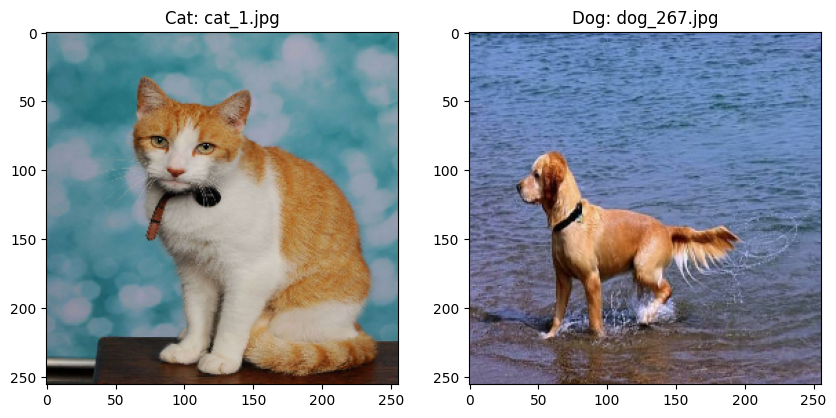


Similitud: 0.8225
Nombre del archivo: dog_321.jpg


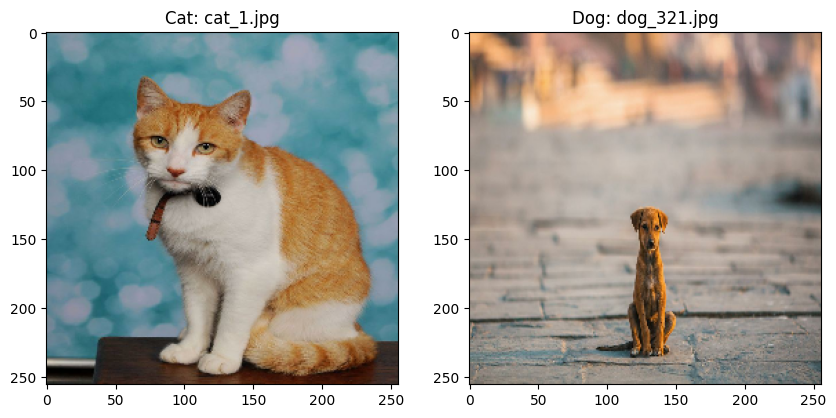


Similitud: 0.8257
Nombre del archivo: dog_436.jpg


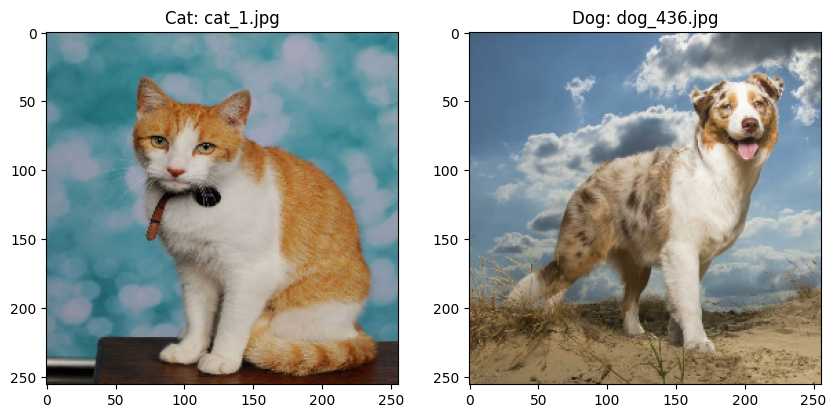


Similitud: 0.8317
Nombre del archivo: dog_212.jpg


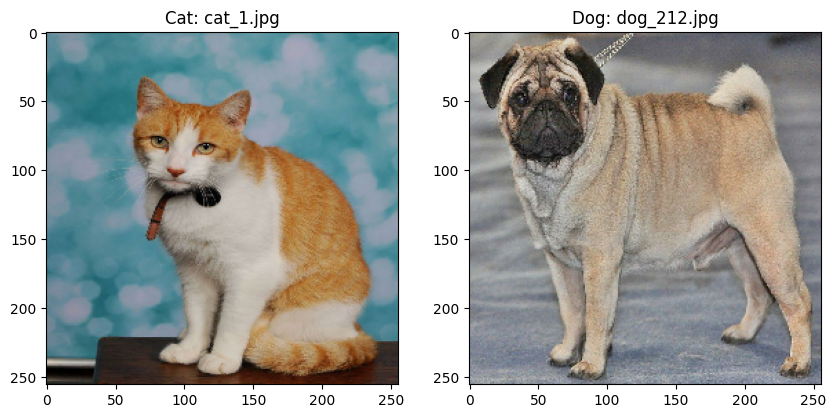


Similitud: 0.8350
Nombre del archivo: dog_273.jpg


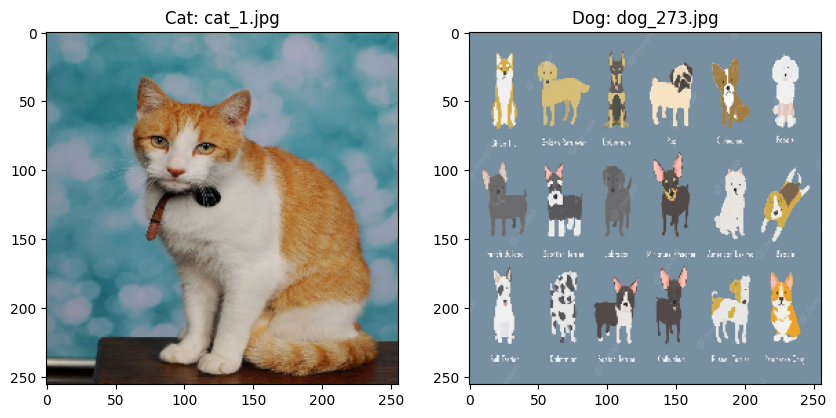

In [20]:
import numpy as np
import scipy.spatial
import matplotlib.pyplot as plt

# Definir las clases (esto se asume basado en tu contexto)
class_cats = 0
class_dogs = 1

# Obtener los índices de las muestras de las clases 'cats' y 'dogs'
cats_indices = estimator.class_indices[class_cats]
dogs_indices = estimator.class_indices[class_dogs]

# Buscar el índice que corresponde al archivo 'cat_1.jpg'
for idx in cats_indices:
    if filenames_dict[idx].name == 'cat_1.jpg':
        first_cat_index = idx
        break
else:
    raise ValueError("No se encontró 'cat_1.jpg' en la clase 'cats'.")

# Verificar que se encontró la primera muestra de 'cats' correctamente
print(f"Primera muestra de 'cats': Índice {first_cat_index}, Nombre del archivo: {filenames_dict[first_cat_index].name}")

# Seleccionar la primera muestra de la clase 'cats'
sample_cat = fully_dataset[first_cat_index]

# Crear un array para almacenar las similitudes con las muestras de 'dogs'
similarities = []

# Calcular la similitud (disimilitud) entre la muestra de 'cats' y todas las muestras de 'dogs'
for dog_index in dogs_indices:
    sample_dog = fully_dataset[dog_index]
    similarity = 1 - scipy.spatial.distance.braycurtis(sample_cat, sample_dog)
    similarities.append((similarity, dog_index))

# Ordenar las similitudes en orden ascendente (menos similar primero)
similarities.sort()

# Mostrar las 10 muestras menos similares
print("Las 10 muestras menos similares (más cercanas a 1 en la métrica Bray-Curtis):")
for i, (similarity, dog_index) in enumerate(similarities[-10:]):
    print(f"{i+1}. Similitud: {similarity:.4f}, Índice de la muestra de 'dogs': {dog_index}, Nombre del archivo: {filenames_dict[dog_index].name}")

# Mostrar las imágenes de las 10 muestras menos similares
for similarity, dog_index in similarities[-10:]:
    sample_dog_filename = filenames_dict[dog_index]
    print(f"\nSimilitud: {similarity:.4f}")
    print(f"Nombre del archivo: {sample_dog_filename.name}")
    
    img_cat = fully_dataset[first_cat_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    img_dog = fully_dataset[dog_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    
    # Mostrar las imágenes usando matplotlib
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img_cat)
    axs[0].set_title(f"Cat: {filenames_dict[first_cat_index].name}")
    axs[1].imshow(img_dog)
    axs[1].set_title(f"Dog: {sample_dog_filename.name}")
    plt.show()


In [ ]:
import numpy as np
import scipy.spatial
import matplotlib.pyplot as plt

# Definir las clases (esto se asume basado en tu contexto)
class_cats = 0
class_dogs = 1

# Obtener los índices de las muestras de las clases 'cats' y 'dogs'
cats_indices = estimator.class_indices[class_cats]
dogs_indices = estimator.class_indices[class_dogs]

# Buscar el índice que corresponde al archivo 'cat_1.jpg'
for idx in cats_indices:
    if filenames_dict[idx].name == 'cat_1.jpg':
        first_cat_index = idx
        break
else:
    raise ValueError("No se encontró 'cat_1.jpg' en la clase 'cats'.")

# Verificar que se encontró la primera muestra de 'cats' correctamente
print(f"Primera muestra de 'cats': Índice {first_cat_index}, Nombre del archivo: {filenames_dict[first_cat_index].name}")

# Seleccionar la primera muestra de la clase 'cats'
sample_cat = fully_dataset[first_cat_index]

# Crear un array para almacenar las similitudes con las muestras de 'dogs'
similarities = []

# Calcular la similitud (disimilitud) entre la muestra de 'cats' y todas las muestras de 'dogs'
for dog_index in dogs_indices:
    sample_dog = fully_dataset[dog_index]
    similarity = 1 - scipy.spatial.distance.braycurtis(sample_cat, sample_dog)
    similarities.append((similarity, dog_index))

# Ordenar las similitudes en orden descendente (más similar primero)
similarities.sort(reverse=True)

# Mostrar las 10 muestras más similares
print("Las 10 muestras más similares (más cercanas a 1 en la métrica Bray-Curtis):")
for i, (similarity, dog_index) in enumerate(similarities[:10]):
    print(f"{i+1}. Similitud: {similarity:.4f}, Índice de la muestra de 'dogs': {dog_index}, Nombre del archivo: {filenames_dict[dog_index].name}")

# Mostrar las imágenes de las 10 muestras más similares
for similarity, dog_index in similarities[:10]:
    sample_dog_filename = filenames_dict[dog_index]
    print(f"\nSimilitud: {similarity:.4f}")
    print(f"Nombre del archivo: {sample_dog_filename.name}")
    
    img_cat = fully_dataset[first_cat_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    img_dog = fully_dataset[dog_index].reshape(img_height, img_width, 3)  # Reconstruir la imagen del array a una imagen 256x256x3
    
    # Mostrar las imágenes usando matplotlib
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(img_cat)
    axs[0].set_title(f"Cat: {filenames_dict[first_cat_index].name}")
    axs[1].imshow(img_dog)
    axs[1].set_title(f"Dog: {sample_dog_filename.name}")
    plt.show()


cats <> dogs
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0674
	Nombre del archivo: dog_403.jpg, Clase: dogs, Similitud: 0.0674


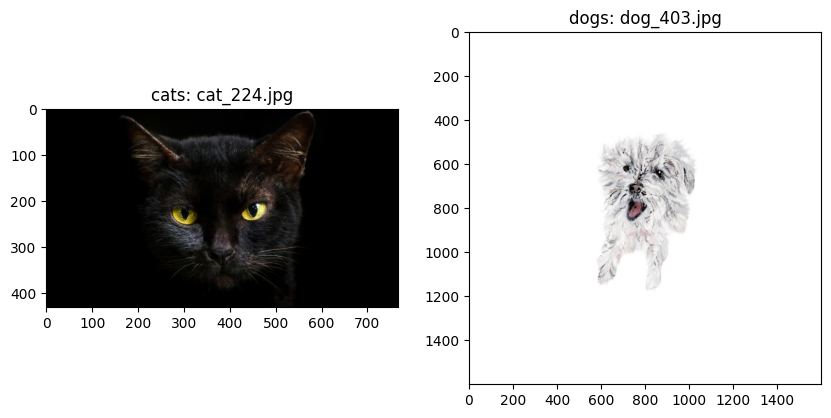

	Nombre del archivo: cat_96.jpg, Clase: cats, Similitud: 0.1821
	Nombre del archivo: dog_505.jpg, Clase: dogs, Similitud: 0.1821


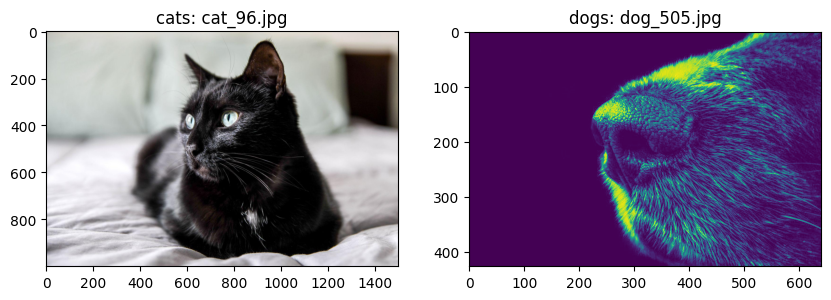

	Nombre del archivo: cat_435.jpg, Clase: cats, Similitud: 0.1844
	Nombre del archivo: dog_197.jpg, Clase: dogs, Similitud: 0.1844


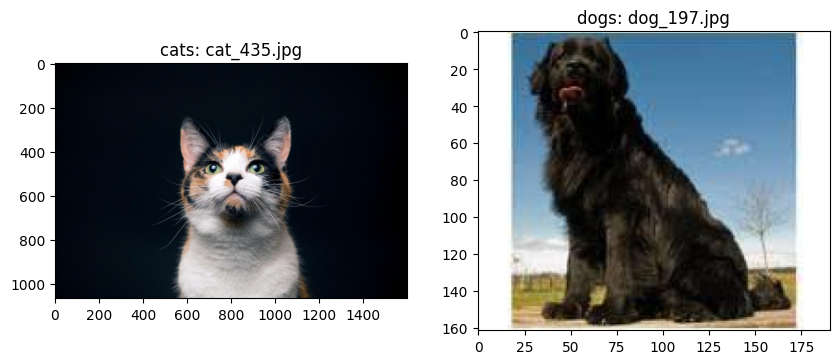

	Nombre del archivo: cat_369.jpg, Clase: cats, Similitud: 0.1865
	Nombre del archivo: dog_412.jpg, Clase: dogs, Similitud: 0.1865


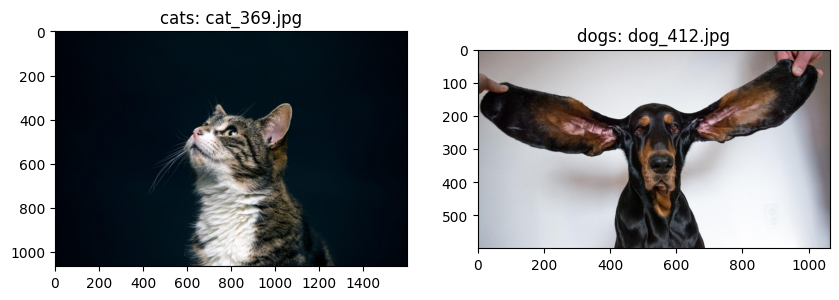

	Nombre del archivo: cat_50.jpg, Clase: cats, Similitud: 0.1887
	Nombre del archivo: dog_344.jpg, Clase: dogs, Similitud: 0.1887


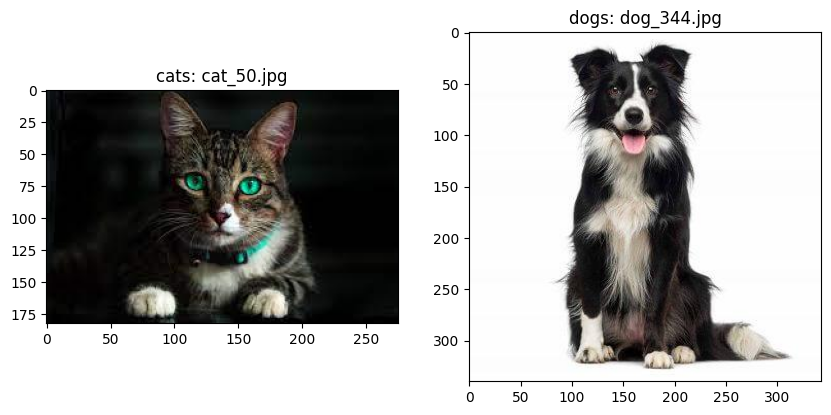

	Nombre del archivo: cat_109.jpg, Clase: cats, Similitud: 0.2088
	Nombre del archivo: dog_509.jpg, Clase: dogs, Similitud: 0.2088


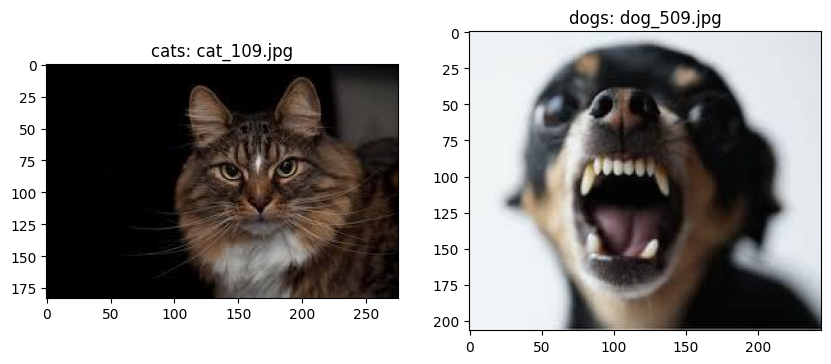

	Nombre del archivo: cat_546.jpg, Clase: cats, Similitud: 0.2406
	Nombre del archivo: dog_543.jpg, Clase: dogs, Similitud: 0.2406


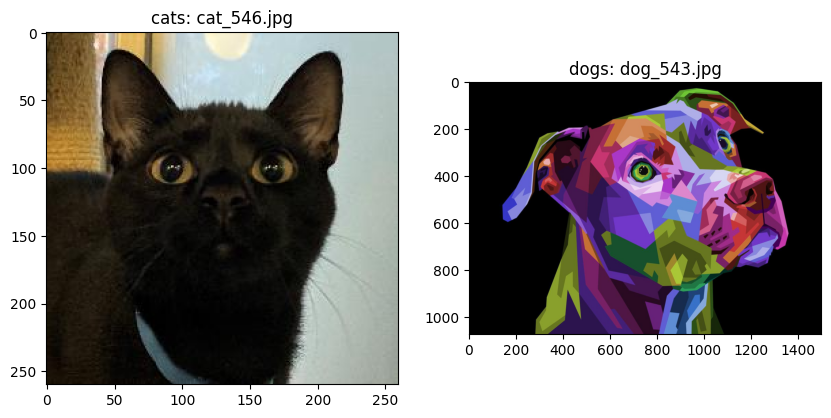

	Nombre del archivo: cat_101.jpg, Clase: cats, Similitud: 0.2505
	Nombre del archivo: dog_324.jpg, Clase: dogs, Similitud: 0.2505


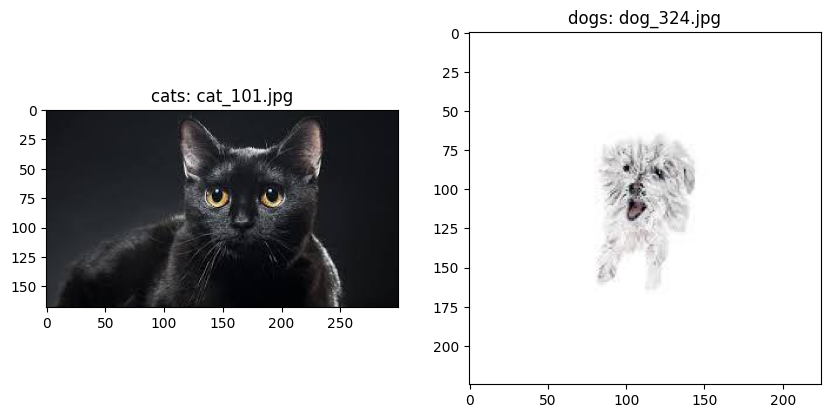

	Nombre del archivo: cat_303.jpg, Clase: cats, Similitud: 0.2658
	Nombre del archivo: dog_128.jpg, Clase: dogs, Similitud: 0.2658


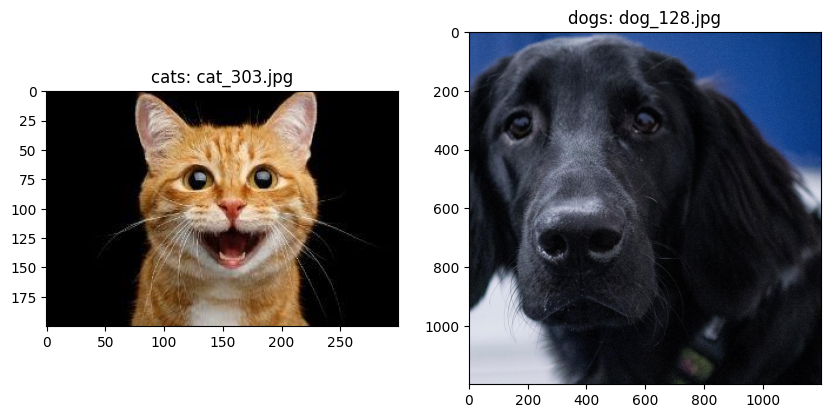

	Nombre del archivo: cat_420.jpg, Clase: cats, Similitud: 0.3095
	Nombre del archivo: dog_39.jpg, Clase: dogs, Similitud: 0.3095


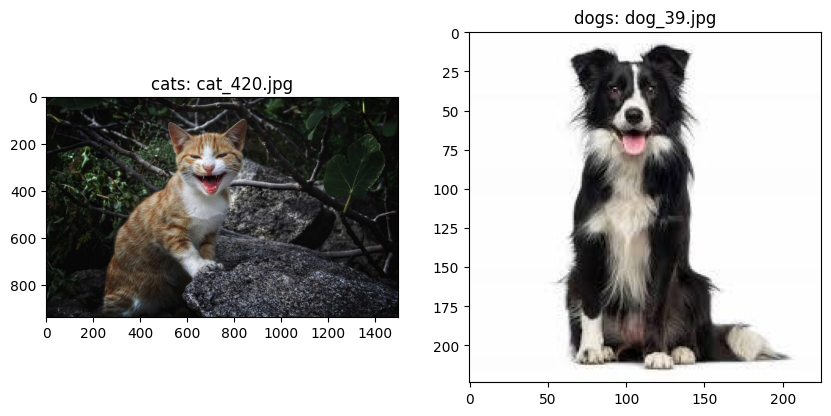

dogs <> cats
	Nombre del archivo: dog_403.jpg, Clase: dogs, Similitud: 0.0674
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0674


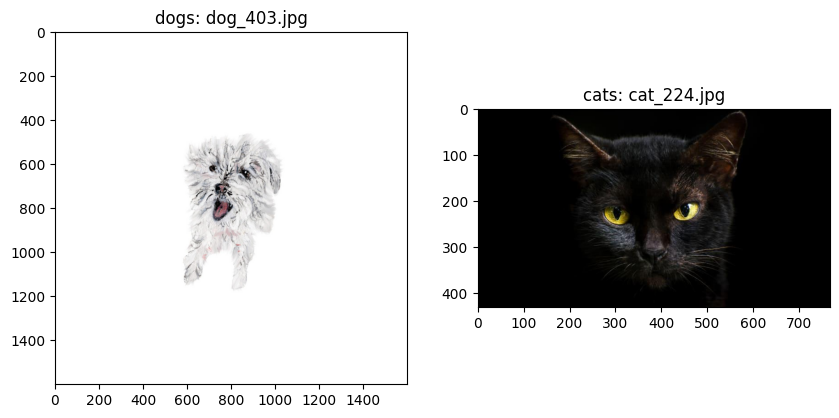

	Nombre del archivo: dog_505.jpg, Clase: dogs, Similitud: 0.1821
	Nombre del archivo: cat_96.jpg, Clase: cats, Similitud: 0.1821


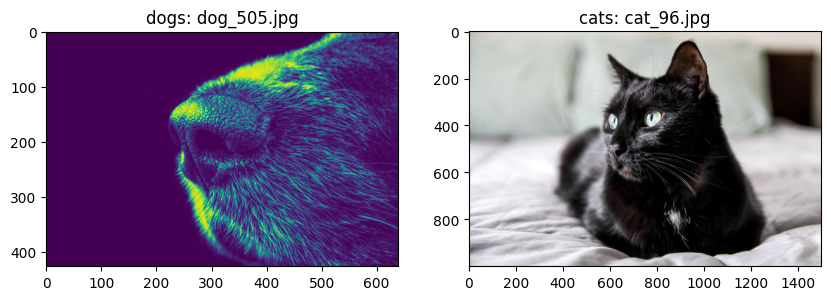

	Nombre del archivo: dog_197.jpg, Clase: dogs, Similitud: 0.1844
	Nombre del archivo: cat_435.jpg, Clase: cats, Similitud: 0.1844


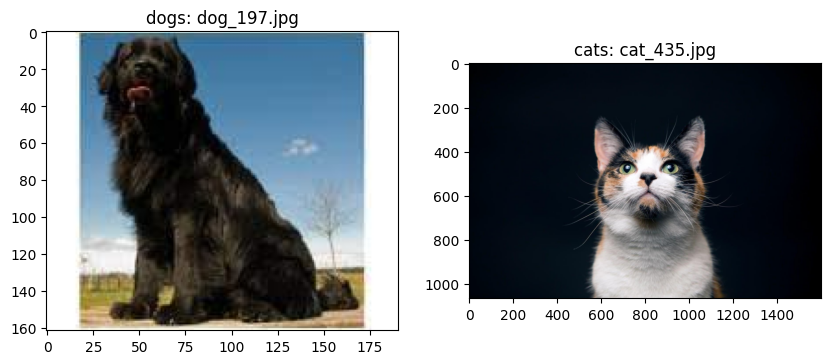

	Nombre del archivo: dog_412.jpg, Clase: dogs, Similitud: 0.1865
	Nombre del archivo: cat_369.jpg, Clase: cats, Similitud: 0.1865


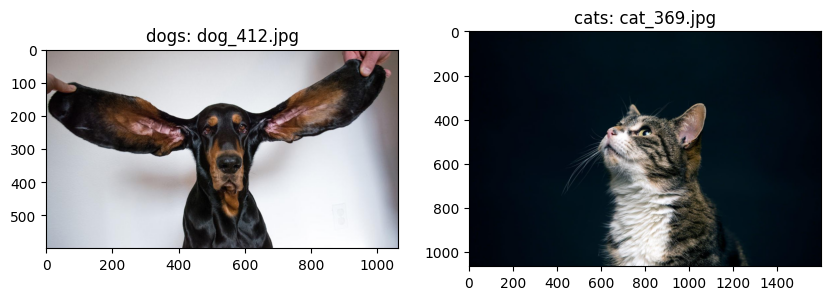

	Nombre del archivo: dog_344.jpg, Clase: dogs, Similitud: 0.1887
	Nombre del archivo: cat_50.jpg, Clase: cats, Similitud: 0.1887


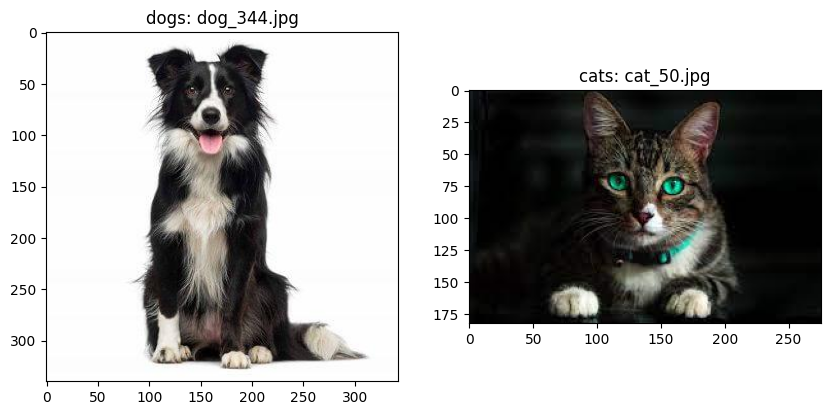

	Nombre del archivo: dog_509.jpg, Clase: dogs, Similitud: 0.2088
	Nombre del archivo: cat_109.jpg, Clase: cats, Similitud: 0.2088


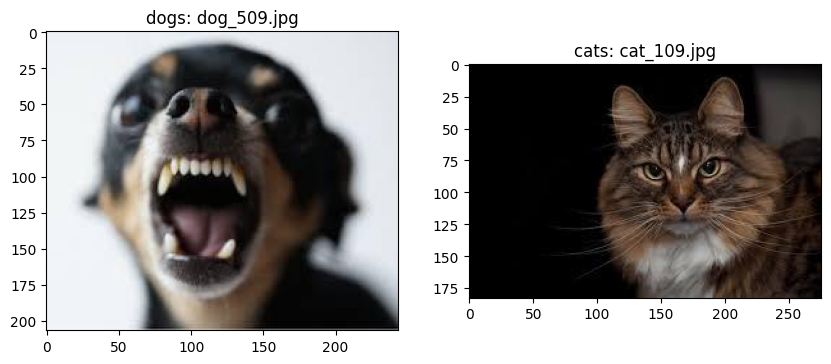

	Nombre del archivo: dog_543.jpg, Clase: dogs, Similitud: 0.2406
	Nombre del archivo: cat_546.jpg, Clase: cats, Similitud: 0.2406


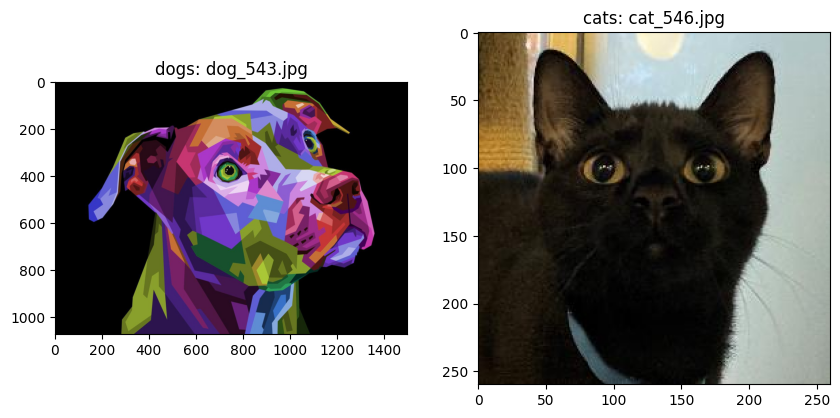

	Nombre del archivo: dog_324.jpg, Clase: dogs, Similitud: 0.2505
	Nombre del archivo: cat_101.jpg, Clase: cats, Similitud: 0.2505


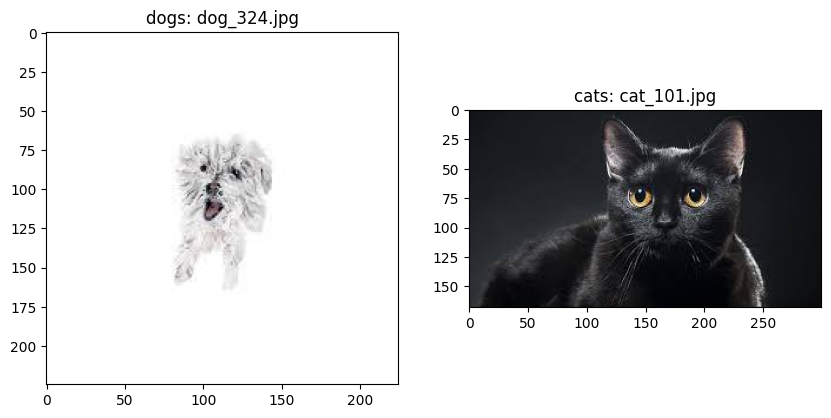

	Nombre del archivo: dog_128.jpg, Clase: dogs, Similitud: 0.2658
	Nombre del archivo: cat_303.jpg, Clase: cats, Similitud: 0.2658


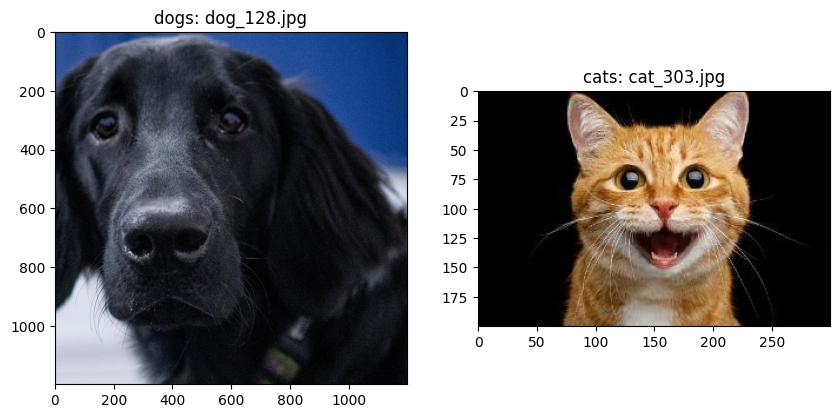

	Nombre del archivo: dog_39.jpg, Clase: dogs, Similitud: 0.3095
	Nombre del archivo: cat_420.jpg, Clase: cats, Similitud: 0.3095


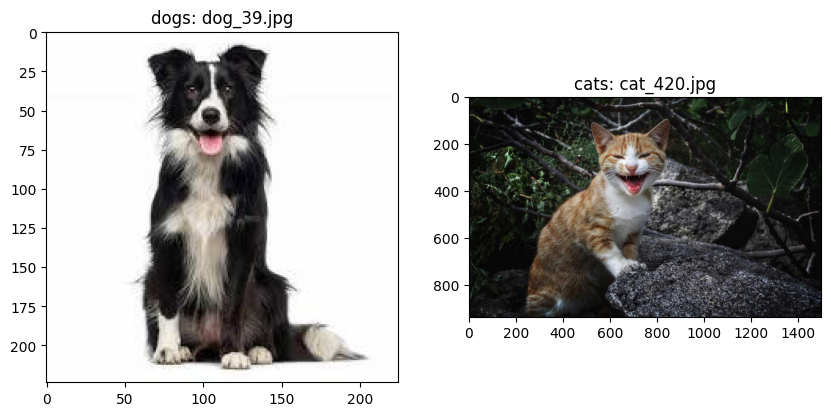

Clase: 0, Número de muestras: 348
Clase: 1, Número de muestras: 348


In [16]:
import numpy as np
import matplotlib.pyplot as plt
import pathlib

# Obtener todos los nombres de archivo en el dataset
filenames = [str(f) for f in directorio_dataset.glob('*/*.jpg')]

# Crear un mapeo de índices a nombres de archivo (solo el nombre de archivo, sin la ruta)
filenames_dict = {i: f for i, f in enumerate(directorio_dataset.glob('*/*.jpg'))}

def show_least_similar_using_P(source_intent, target_intent, estimator, class_names, filenames_dict):
    print(f"{class_names[source_intent]} <> {class_names[target_intent]}")
    
    # Obtener la matriz de similitud de las muestras entre las clases
    P = estimator.P[(source_intent, target_intent)]
    
    # Ordenar los índices según las similitudes (de menor a mayor)
    least_similar_indices = np.argsort(P, axis=None)
    
    # Conjunto para llevar un registro de los archivos ya mostrados
    shown_files = set()
    count = 0
    
    for idx in least_similar_indices:
        if count >= 10:
            break
        
        # Convertir el índice plano a índice 2D
        idx_2d = np.unravel_index(idx, P.shape)
        
        # Obtener los índices de las muestras en el dataset
        source_idx = estimator.class_indices[source_intent][idx_2d[0]]
        target_idx = estimator.class_indices[target_intent][idx_2d[1]]
        
        # Verificar que los índices estén dentro de los límites del dataset
        if source_idx < len(filenames_dict) and target_idx < len(filenames_dict):
            source_filename = filenames_dict[int(source_idx)]
            target_filename = filenames_dict[int(target_idx)]
            
            if source_filename not in shown_files and target_filename not in shown_files:
                shown_files.add(source_filename)
                shown_files.add(target_filename)
                
                value = P[idx_2d]
                print(f"\tNombre del archivo: {source_filename.name}, Clase: {class_names[source_intent]}, Similitud: {value:.4f}")
                print(f"\tNombre del archivo: {target_filename.name}, Clase: {class_names[target_intent]}, Similitud: {value:.4f}")
                
                img_source = plt.imread(source_filename)
                img_target = plt.imread(target_filename)
                
                fig, axs = plt.subplots(1, 2, figsize=(10, 5))
                axs[0].imshow(img_source)
                axs[0].set_title(f"{class_names[source_intent]}: {source_filename.name}")
                axs[1].imshow(img_target)
                axs[1].set_title(f"{class_names[target_intent]}: {target_filename.name}")
                plt.show()
                
                count += 1

# Suponiendo que `pairs` contiene los índices de las clases en el formato [(0, 1)]
pairs = [(0, 1)]

first_pair = pairs[0]

# Mostrar los menos similares usando la matriz de pares (P)
show_least_similar_using_P(first_pair[0], first_pair[1], estimator, class_names, filenames_dict)
show_least_similar_using_P(first_pair[1], first_pair[0], estimator, class_names, filenames_dict)

for class_name, indices in estimator.class_indices.items():
    print(f"Clase: {class_name}, Número de muestras: {len(indices)}")


In [29]:
import numpy as np

# Supongamos que tienes las siguientes listas de características de las muestras de cada clase
cats_features = np.random.rand(348, 256)  # 348 muestras con características de dimensión 256
dogs_features = np.random.rand(348, 256)  # 348 muestras con características de dimensión 256

# Función de similitud (por ejemplo, producto punto)
def similitud(a, b):
    return np.dot(a, b)

# Crear la matriz P
P = np.zeros((348, 348))

# Llenar la matriz P
for i in range(348):
    for j in range(348):
        P[i, j] = similitud(cats_features[i], dogs_features[j])

print(P)


[[62.4563917  65.47393804 67.78834164 ... 63.59921926 62.80522405
  65.58321387]
 [57.65262125 58.10181839 60.1567362  ... 57.0890805  57.91699683
  60.84809753]
 [65.76595038 64.65200762 71.48427546 ... 67.56925135 65.47502585
  67.72047189]
 ...
 [62.87407059 62.4182284  65.27919016 ... 60.97763998 60.81342269
  61.67098991]
 [65.36439011 64.79766896 69.10960238 ... 64.55066425 64.31780743
  64.33201295]
 [59.09105703 61.90333815 62.97410965 ... 58.71997378 61.00966941
  61.33858902]]


In [37]:
# Acceder a la matriz M después de ajustar el modelo
M = estimator.M

# Ordenar los índices según las similitudes (de menor a mayor)
least_similar_indices = np.argsort(M, axis=None)

# Conjunto para llevar un registro de los archivos ya mostrados
shown_files = set()
count = 0

# Crear un diccionario de nombres de archivo y clases
filenames_dict = {i: f.name for i, f in enumerate(directorio_dataset.glob('*/*.jpg'))}
class_names_list = ['cats' if label == 0 else 'dogs' for label in fully_labels]

# Mostrar las 10 muestras menos similares
for idx in least_similar_indices:
    if count >= 10:
        break

    # Convertir el índice plano a índice 2D
    idx_2d = np.unravel_index(idx, M.shape)

    # Obtener los índices de las muestras en el dataset
    source_idx = idx_2d[0]
    target_idx = idx_2d[1]

    # Verificar que los índices estén dentro de los límites del dataset
    if source_idx < len(filenames_dict) and target_idx < len(filenames_dict):
        source_filename = filenames_dict[int(source_idx)]
        target_filename = filenames_dict[int(target_idx)]

        if (source_filename, target_filename) not in shown_files and (target_filename, source_filename) not in shown_files:
            shown_files.add((source_filename, target_filename))
            shown_files.add((target_filename, source_filename))

            value = M[idx_2d]
            print(f"\tNombre del archivo: {source_filename}, Clase: {class_names_list[source_idx]}, Similitud: {value:.4f}")
            print(f"\tNombre del archivo: {target_filename}, Clase: {class_names_list[target_idx]}, Similitud: {value:.4f}")
            count += 1

	Nombre del archivo: cat_544.jpg, Clase: cats, Similitud: 0.0508
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0508
	Nombre del archivo: dog_403.jpg, Clase: dogs, Similitud: 0.0674
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0674
	Nombre del archivo: dog_324.jpg, Clase: dogs, Similitud: 0.0675
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0675
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0693
	Nombre del archivo: cat_387.jpg, Clase: cats, Similitud: 0.0693
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0693
	Nombre del archivo: cat_446.jpg, Clase: cats, Similitud: 0.0693
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0694
	Nombre del archivo: dog_546.jpg, Clase: dogs, Similitud: 0.0694
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0700
	Nombre del archivo: cat_203.jpg, Clase: cats, Similitud: 0.0700
	Nombre del archivo: cat_224.jpg, Clase: cats, Similitud: 0.0702
	Nombre del archivo: cat_